# 01. Import Library

In [8]:
import numpy as np 
import pandas as pd

import pickle
import gzip

import matplotlib.pyplot as plt
%matplotlib inline

# 02. Load Data

In [2]:
data_path = "./RML2016.10a_dict.pkl"

with open(data_path, 'rb') as f:
    u = pickle._Unpickler(f)
    u.encoding = 'latin1'
    p = u.load()

In [3]:
print(p)

{('QPSK', 2): array([[[-0.00590147, -0.00234582, -0.00074506, ..., -0.00326824,
         -0.00304144,  0.00569031],
        [-0.00779554, -0.00781637, -0.00401967, ...,  0.01032196,
          0.00841506,  0.00544548]],

       [[ 0.00503262,  0.0009438 , -0.00189324, ...,  0.00710436,
          0.00647364,  0.00527375],
        [-0.00399943,  0.00161782,  0.00536932, ..., -0.00674945,
          0.00022403, -0.00185736]],

       [[ 0.00523907,  0.00738907,  0.00727646, ..., -0.00567421,
         -0.00974218, -0.01044694],
        [ 0.00419956,  0.0073807 ,  0.00528897, ..., -0.00246656,
          0.00416547, -0.00496793]],

       ...,

       [[ 0.0026172 ,  0.00298624,  0.00437732, ..., -0.00955281,
         -0.00808954, -0.00061479],
        [ 0.00322034,  0.00341152,  0.00447983, ...,  0.00353227,
          0.00287296,  0.00412169]],

       [[-0.00764636, -0.00967675, -0.00678905, ..., -0.00210244,
         -0.00629975, -0.00922944],
        [ 0.00805844,  0.00562819,  0.00702108,

In [4]:
m_set = set()
s_set = set()
p_keys = list(p.keys())

# 03. Data Detail

In [5]:
# Key (Modulation, SNR)
for modulation, snr in p_keys:
    m_set.add(modulation)
    s_set.add(snr)

In [6]:
# size detail
print('Modulation') 
print('length', len(m_set), m_set)
print()
print('SNR')
print('length', len(s_set), s_set)

Modulation
length 11 {'CPFSK', 'QAM16', 'PAM4', 'AM-SSB', 'QAM64', 'GFSK', 'QPSK', 'BPSK', '8PSK', 'AM-DSB', 'WBFM'}

SNR
length 20 {0, 2, 4, 6, 8, 10, 12, 14, 16, 18, -20, -18, -16, -14, -12, -10, -8, -6, -4, -2}


In [7]:
# pick one type
print("type:", p_keys[0])
p_t1 = p[p_keys[0]]
print("samples in one type:", len(p_t1))
print("components in one sample:", len(p_t1[0]))
print("dimontional of the component", len(p_t1[0][0]), len(p_t1[0][1]))

print("total samples:", len(p_keys) * len(p_t1))

type: ('QPSK', 2)
samples in one type: 1000
components in one sample: 2
dimontional of the component 128 128
total samples: 220000


# 04. Data Analysis 

In [8]:
pd.concat([
    pd.DataFrame(p_t1[0][0], columns=["in-phase"]).describe(),
    pd.DataFrame(p_t1[0][0], columns=["quadrature"]).describe()
], axis=1)

,in-phase,quadrature
count,128.000000,128.000000
mean,-0.000475,-0.000475
std,0.005545,0.005545
min,-0.010687,-0.010687
25%,-0.005073,-0.005073
50%,-0.000048,-0.000048
75%,0.003649,0.003649
max,0.010764,0.010764


# 05. Data Plotting(Time Series Form)

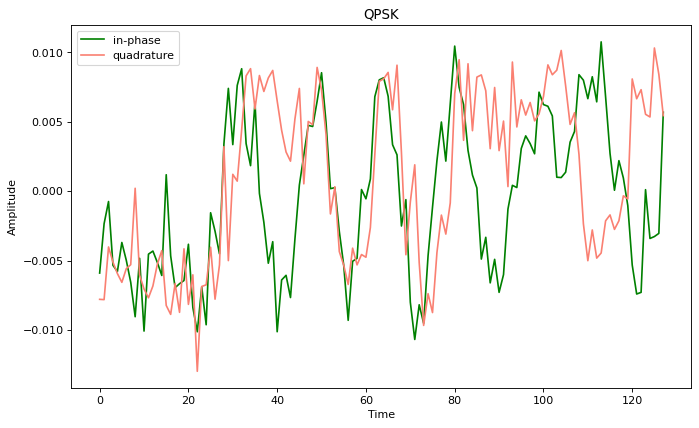

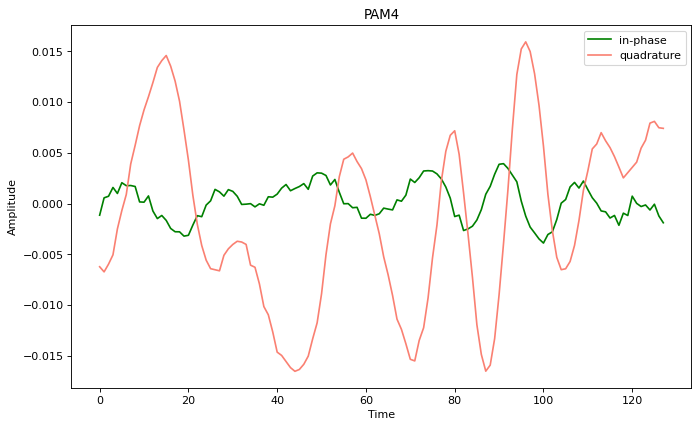

In [9]:
#for i in range(len(p_keys)):
for i in range(2):
    p_t1 = p[p_keys[i]]
    fig = plt.figure(figsize=(10, 6), dpi=80)

    plt.plot(p_t1[0][0], color='green', label='in-phase')
    plt.plot(p_t1[0][1], color='salmon', label='quadrature')
    
    plt.title(p_keys[i][0])
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()

# 06. Data Plotting(Image Form)

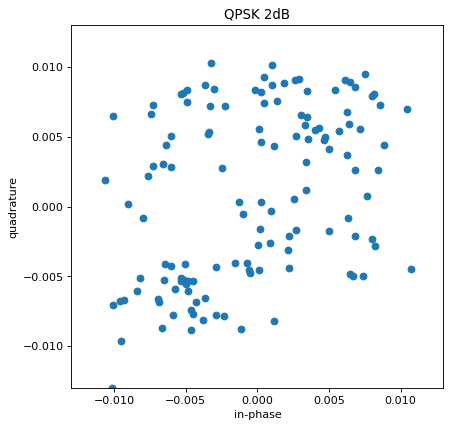

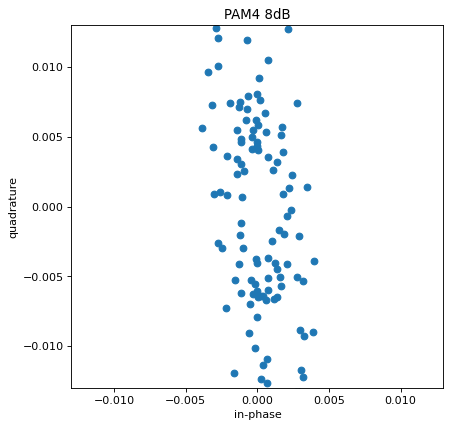

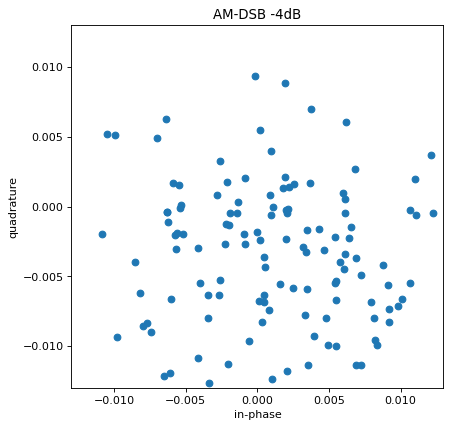

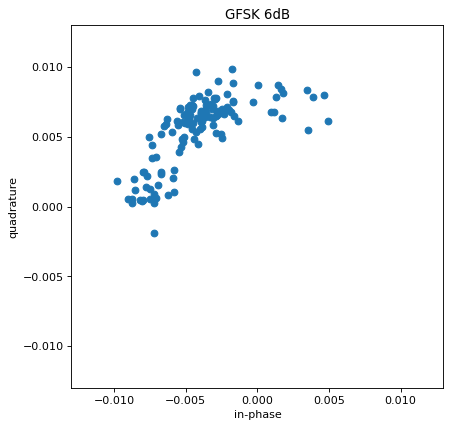

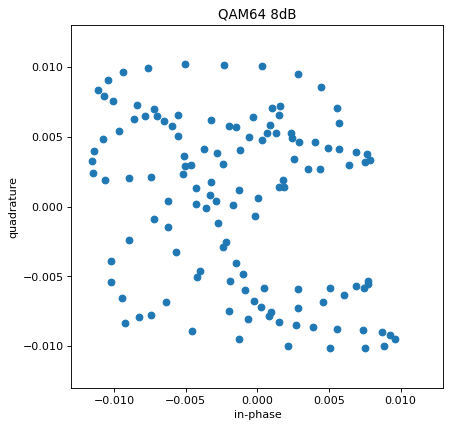

...

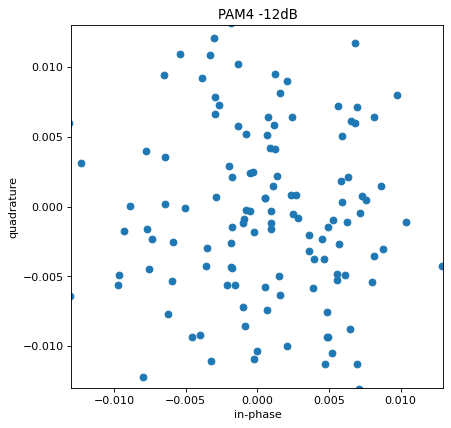

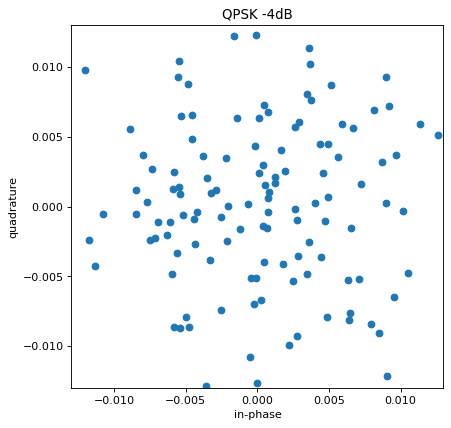

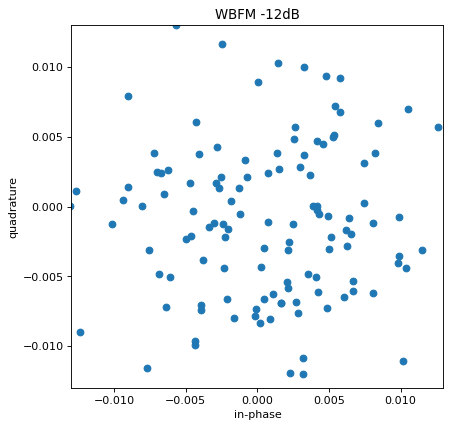

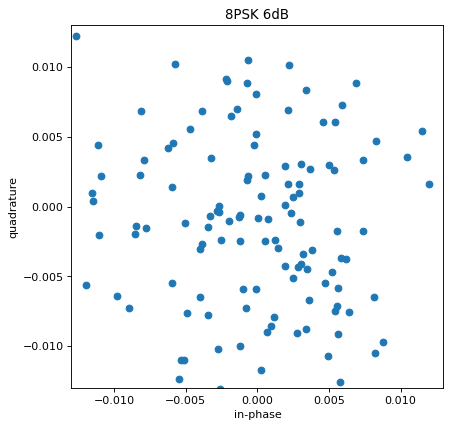

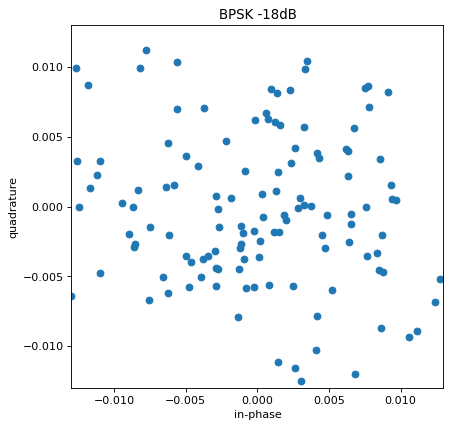

In [10]:
for i in range(len(p_keys)):
    p_t1 = p[p_keys[i]]
    fig = plt.figure(figsize=(6, 6), dpi=80)
    
    plt.xlim([-0.013, 0.013])
    plt.ylim([-0.013, 0.013])
    
    plt.title(p_keys[i][0] + ' ' + str(p_keys[i][1]) + 'dB')
    plt.xlabel('in-phase')
    plt.ylabel('quadrature')
    plt.scatter(p_t1[0][0], p_t1[0][1])
    plt.show()

# 07. Define Noise Function(Additive white Gaussian noise)

In [11]:
import math

def awgn(signal, snr):
    regsnr = snr
    sigpower = sum([math.pow(abs(signal[i]),2) for i in range(len(signal))])
    sigpower = sigpower/len(signal)
    noisepower = sigpower/(math.pow(10,regsnr/10))
    noise = math.sqrt(noisepower)*(np.random.uniform(-1,1,size=len(signal)))
    return noise

# 08. Noise Generation(For sin function)

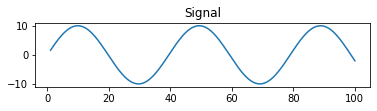

In [12]:
t = np.linspace(1, 100, 1000)
x = 10*np.sin(t/(2*np.pi))
plt.subplot(3,1,1)
plt.plot(t, x)
plt.title('Signal')
plt.show()

In [13]:
noise = awgn(x, 12)

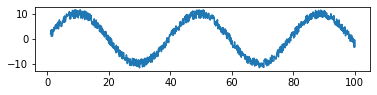

In [14]:
t = np.linspace(1, 100, 1000)
plt.subplot(3,1,1)
plt.plot(t, x + noise)

# 09. Noise Generation(For dataset)

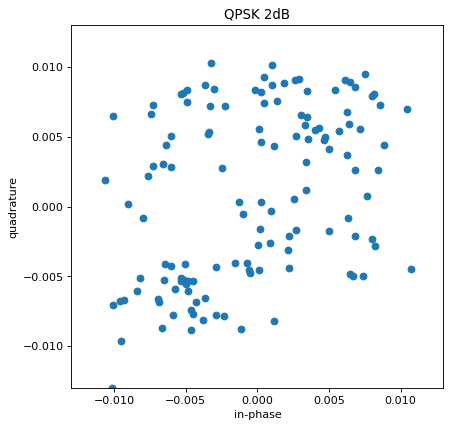

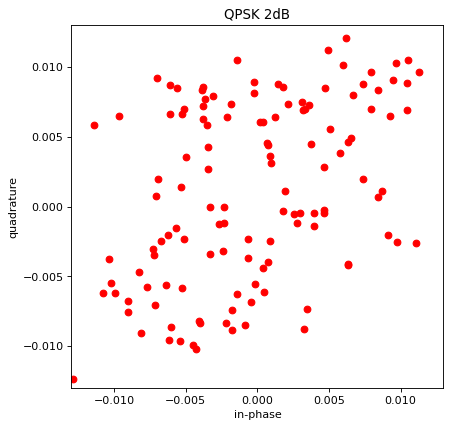

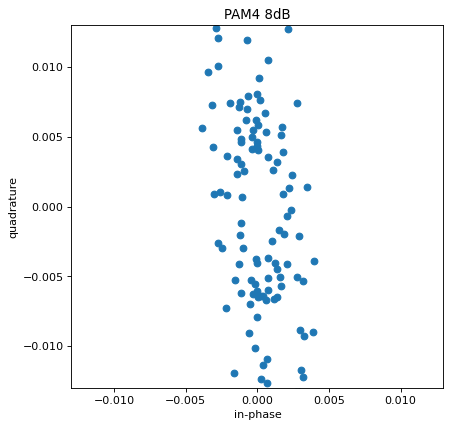

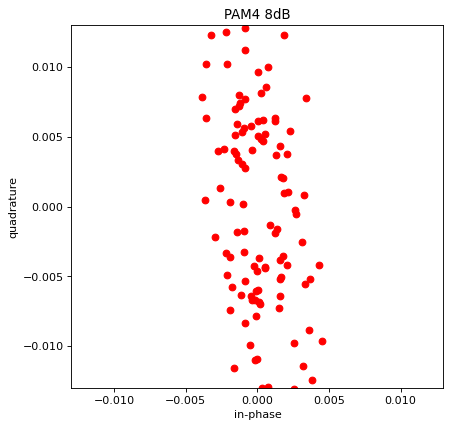

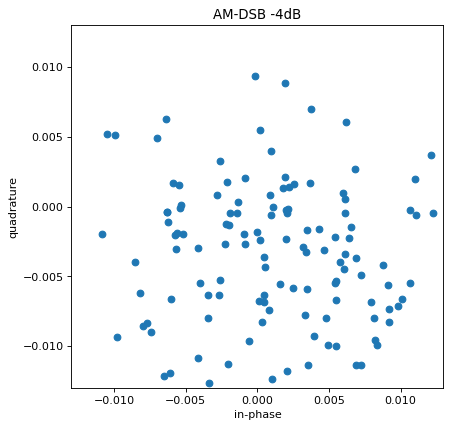

...

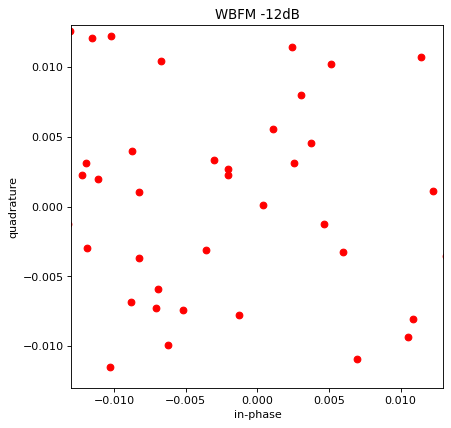

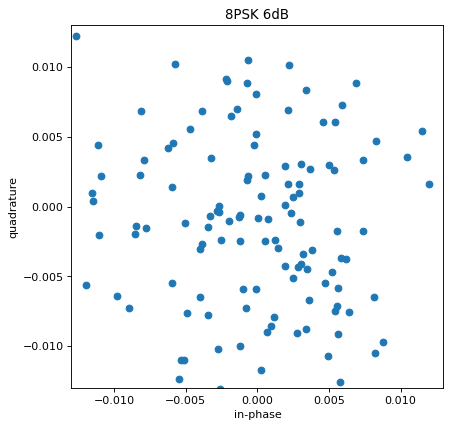

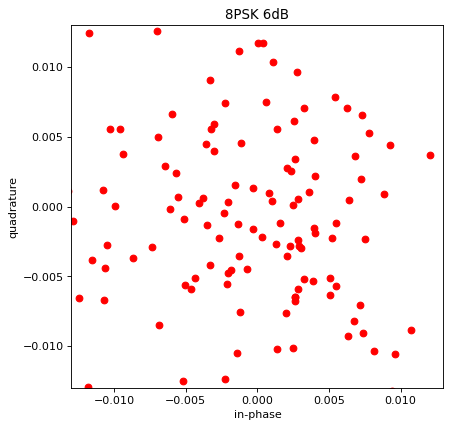

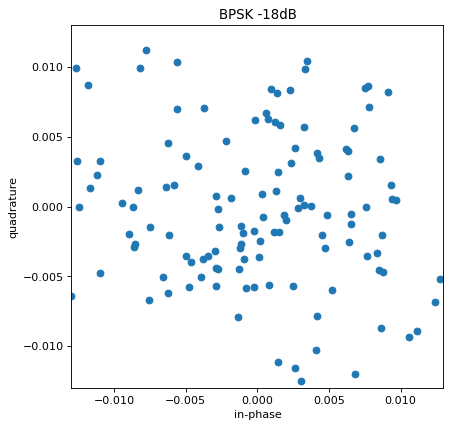

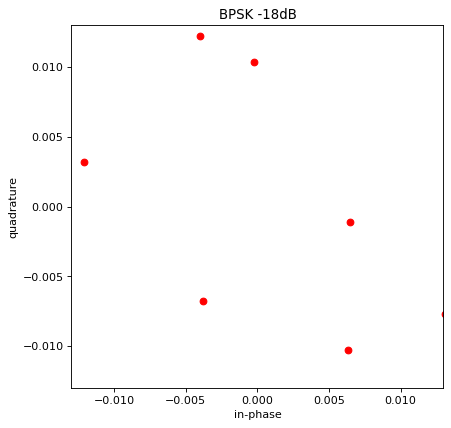

In [15]:
for i in range(len(p_keys)):
    p_t1 = p[p_keys[i]]
    fig = plt.figure(figsize=(6, 6), dpi=80)
    # Orignal data
    plt.xlim([-0.013, 0.013])
    plt.ylim([-0.013, 0.013])
    
    plt.title(p_keys[i][0] + ' ' + str(p_keys[i][1]) + 'dB')
    plt.xlabel('in-phase')
    plt.ylabel('quadrature')
    plt.scatter(p_t1[0][0], p_t1[0][1])
    plt.show()
    
    # Add Noise
    p_t1 = p[p_keys[i]]
    fig = plt.figure(figsize=(6, 6), dpi=80)
    
    plt.xlim([-0.013, 0.013])
    plt.ylim([-0.013, 0.013])
    
    plt.title(p_keys[i][0] + ' ' + str(p_keys[i][1]) + 'dB')
    plt.xlabel('in-phase')
    plt.ylabel('quadrature')
    plt.scatter(p_t1[0][0] + awgn(p_t1[0][0], p_keys[i][1]), p_t1[0][1] + awgn(p_t1[0][0], p_keys[i][1]), color = 'red')
    plt.show()
    
    

# 10. Noise Generation(Gaussian Noise)

In [27]:
def gn(arr, std):
    noise = np.random.normal(np.mean(arr), std, 128)
    return noise 

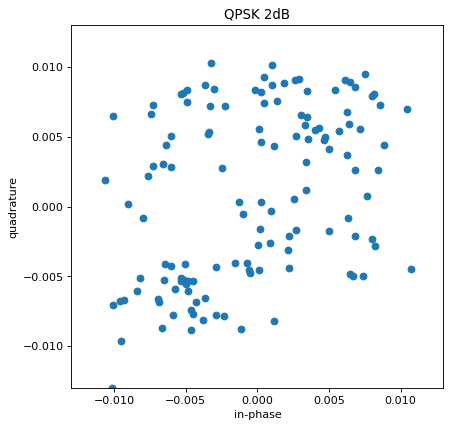

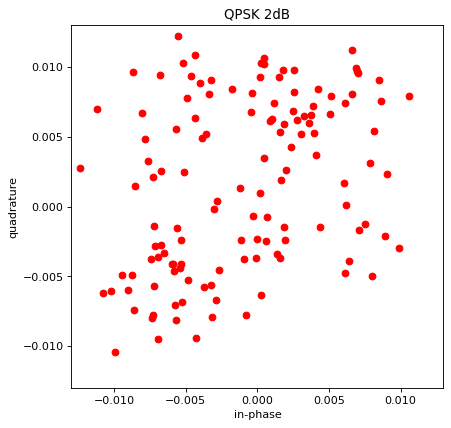

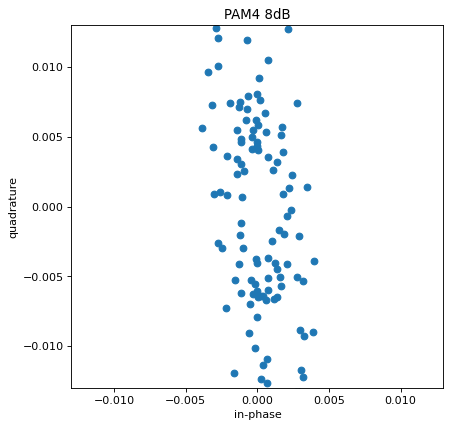

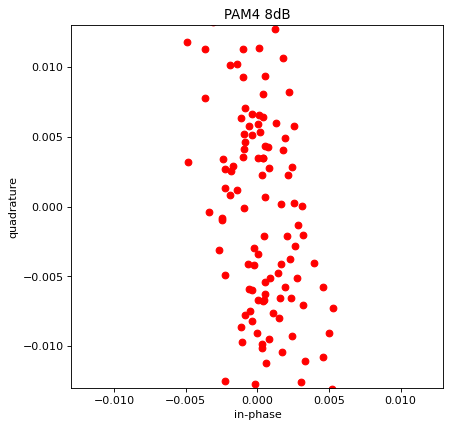

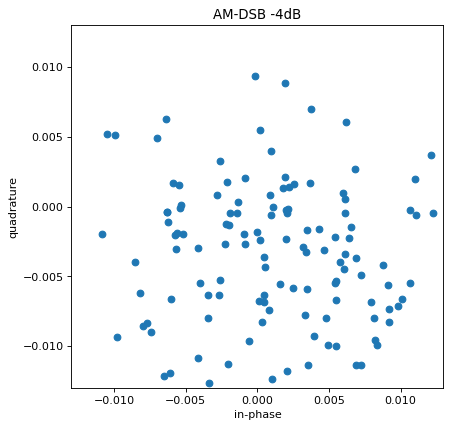

...

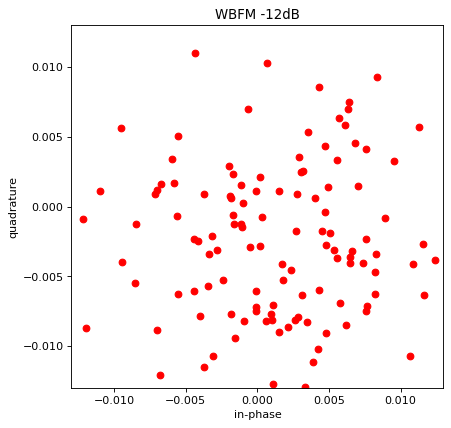

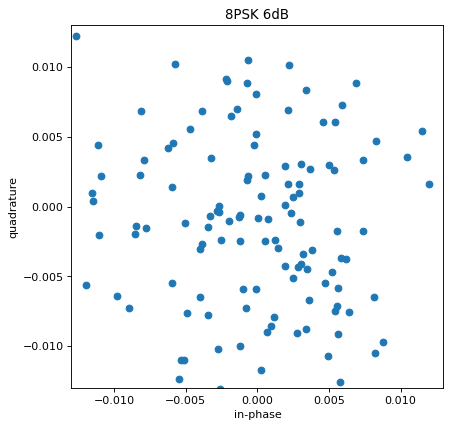

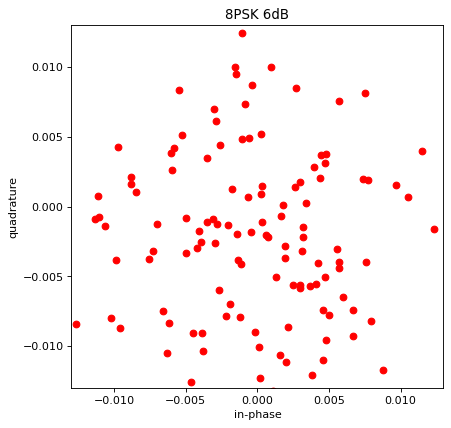

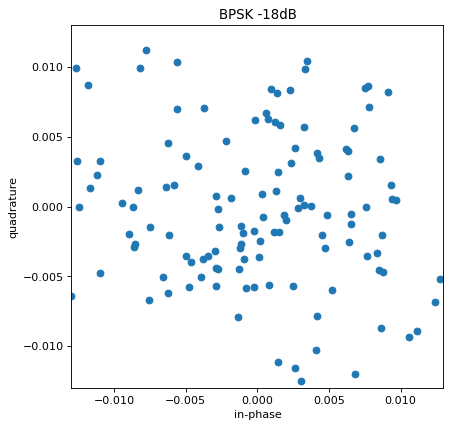

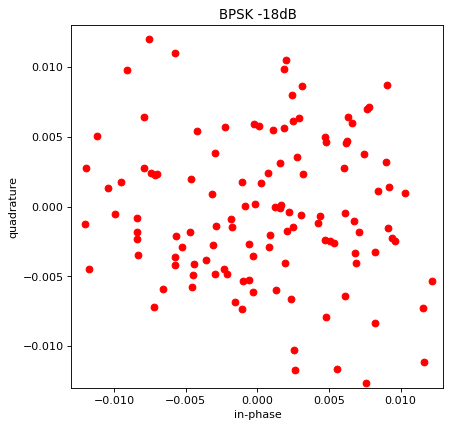

In [32]:
for i in range(len(p_keys)):
    p_t1 = p[p_keys[i]]
    fig = plt.figure(figsize=(6, 6), dpi=80)
    # Orignal data
    plt.xlim([-0.013, 0.013])
    plt.ylim([-0.013, 0.013])
    
    plt.title(p_keys[i][0] + ' ' + str(p_keys[i][1]) + 'dB')
    plt.xlabel('in-phase')
    plt.ylabel('quadrature')
    plt.scatter(p_t1[0][0], p_t1[0][1])
    plt.show()
    
    # Add Noise
    p_t1 = p[p_keys[i]]
    fig = plt.figure(figsize=(6, 6), dpi=80)
    
    plt.xlim([-0.013, 0.013])
    plt.ylim([-0.013, 0.013])
    
    plt.title(p_keys[i][0] + ' ' + str(p_keys[i][1]) + 'dB')
    plt.xlabel('in-phase')
    plt.ylabel('quadrature')
    plt.scatter(p_t1[0][0] + gn(p_t1[0][0], 0.001), p_t1[0][1] + gn(p_t1[0][1], 0.001), color = 'red')
    plt.show()
    